# Car Price Prediction <br><sup>Machine Learning Regression Algorithm Selection</sup></br>

*Eduardo Solano Jaime*

*0213663*

*ECID*

*Universidad Panamericana campus Guadalajara*

[Dataset](https://www.kaggle.com/datasets/rashikrahmanpritom/heart-attack-analysis-prediction-dataset?select=heart.csv)

In [1]:
import pandas as pd

df = pd.read_csv('heart.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trtbps    303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalachh  303 non-null    int64  
 8   exng      303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slp       303 non-null    int64  
 11  caa       303 non-null    int64  
 12  thall     303 non-null    int64  
 13  output    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [2]:
df.head(5)

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [2]:
feature = df.columns.values
numeric = ['age', 'trtbps',	'chol', 'thalachh',	'oldpeak']
onehot =  ['cp', 'restecg', 'slp', 'caa', 'thall']

In [4]:
print(f"The original DataFrame has a shape of {df.shape}")

The original DataFrame has a shape of (303, 14)


In [5]:
df.info() # Instead of dtype, it gives more information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trtbps    303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalachh  303 non-null    int64  
 8   exng      303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slp       303 non-null    int64  
 11  caa       303 non-null    int64  
 12  thall     303 non-null    int64  
 13  output    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [6]:
df.describe()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


In [7]:
df.isnull().sum()

age         0
sex         0
cp          0
trtbps      0
chol        0
fbs         0
restecg     0
thalachh    0
exng        0
oldpeak     0
slp         0
caa         0
thall       0
output      0
dtype: int64

In [3]:
target = 'output'
display(df.groupby([target]).count())

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall
output,,,,,,,,,,,,,
0,138,138,138,138,138,138,138,138,138,138,138,138,138
1,165,165,165,165,165,165,165,165,165,165,165,165,165


In [15]:
import seaborn as sea

sea.set_theme()

c:\Users\Eduardo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


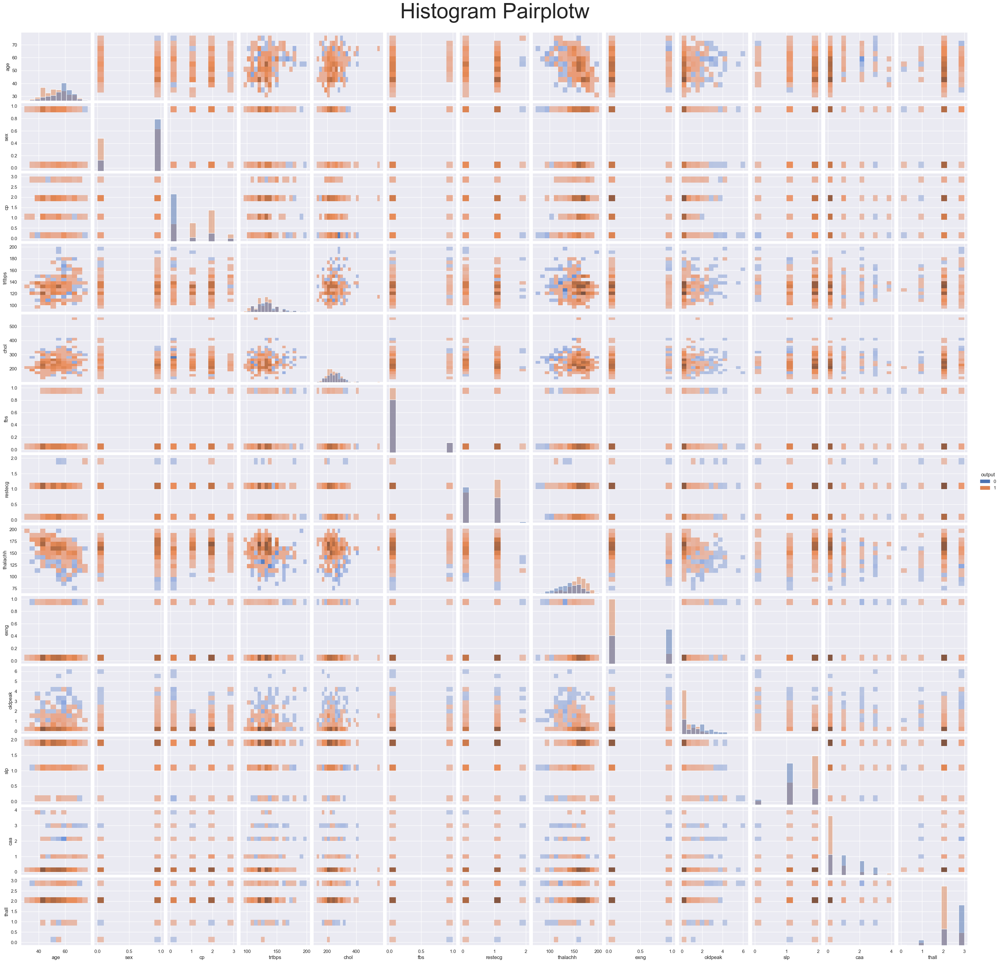

In [16]:
f = sea.pairplot(df, hue=target, kind='hist')
name = "Histogram Pairplotw"
f.fig.subplots_adjust(top=.95)
f.fig.suptitle(name, size=50)
f.savefig(name, dpi=600)

c:\Users\Eduardo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


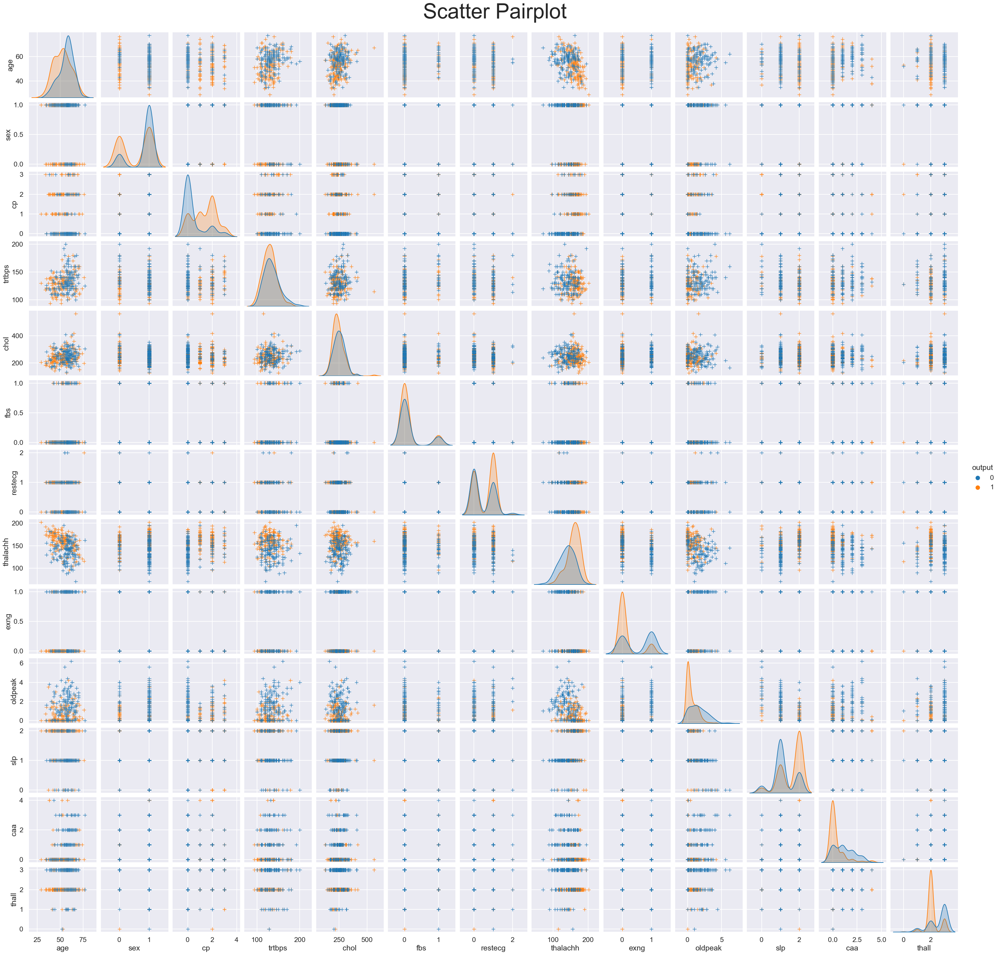

In [13]:
f = sea.pairplot(df, hue=target,  plot_kws=dict(marker="+", linewidth=1), kind='scatter')
name = "Scatter Pairplot"
f.fig.subplots_adjust(top=.95)
f.fig.suptitle(name, size=50)
f.savefig(name, dpi=600)

c:\Users\Eduardo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


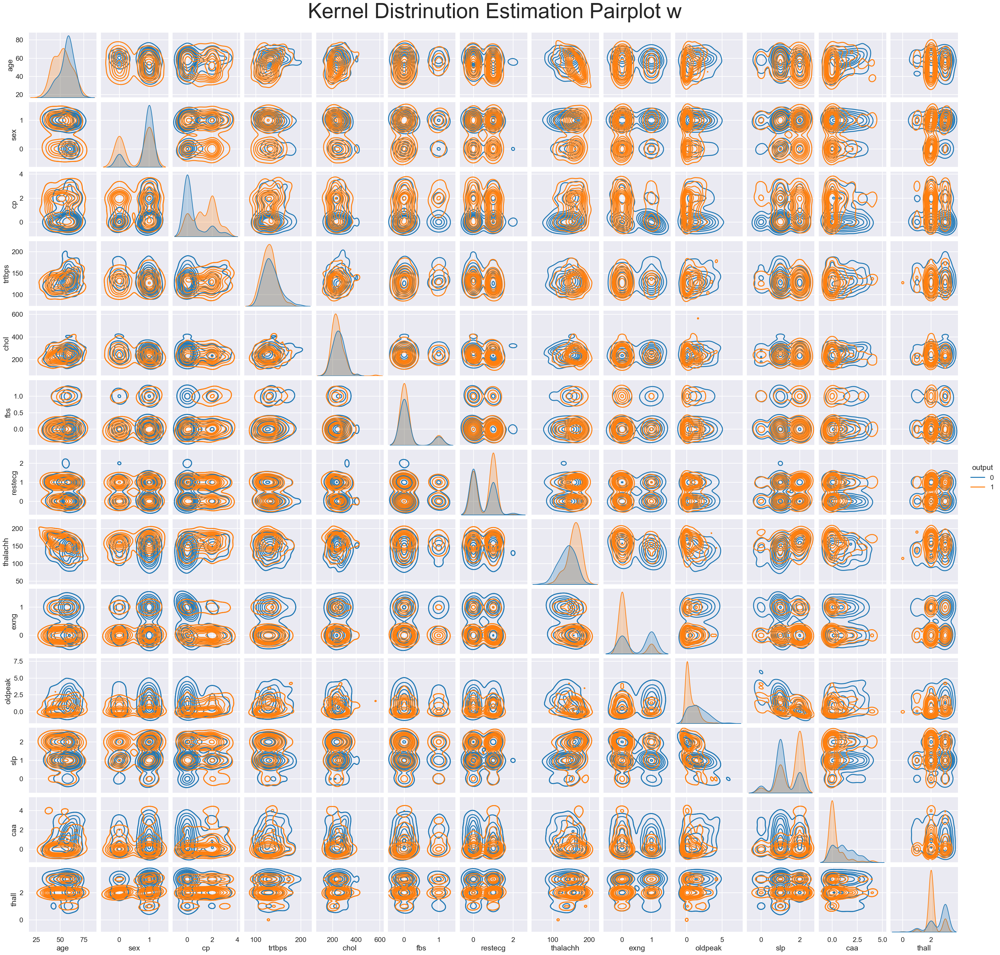

In [14]:
f = sea.pairplot(df, hue=target,  kind='kde', )
f.map_lower(sea.kdeplot, levels=4, color=".2")
name = "Kernel Distrinution Estimation Pairplot"
f.fig.subplots_adjust(top=.95)
f.fig.suptitle("Kernel Distrinution Estimation Pairplot w", size=50)
f.savefig(name, dpi=600)

In [13]:
sea.set_context("paper")

In [18]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

def Transform(data):
    ct = ColumnTransformer(transformers=
                        [('numeric', StandardScaler(), numeric),
                        ('work', OneHotEncoder(), onehot)],
                        remainder='passthrough')

    data_t = pd.DataFrame(ct.fit_transform(data))
    data_t.columns = [s[s.find('_')+2:] for s in list(ct.get_feature_names_out())]
    return data_t
        
df_t = Transform(df)

In [15]:
df_t.dtypes

age          float64
trtbps       float64
chol         float64
thalachh     float64
oldpeak      float64
cp_0         float64
cp_1         float64
cp_2         float64
cp_3         float64
restecg_0    float64
restecg_1    float64
restecg_2    float64
slp_0        float64
slp_1        float64
slp_2        float64
caa_0        float64
caa_1        float64
caa_2        float64
caa_3        float64
caa_4        float64
thall_0      float64
thall_1      float64
thall_2      float64
thall_3      float64
sex          float64
fbs          float64
exng         float64
output       float64
dtype: object

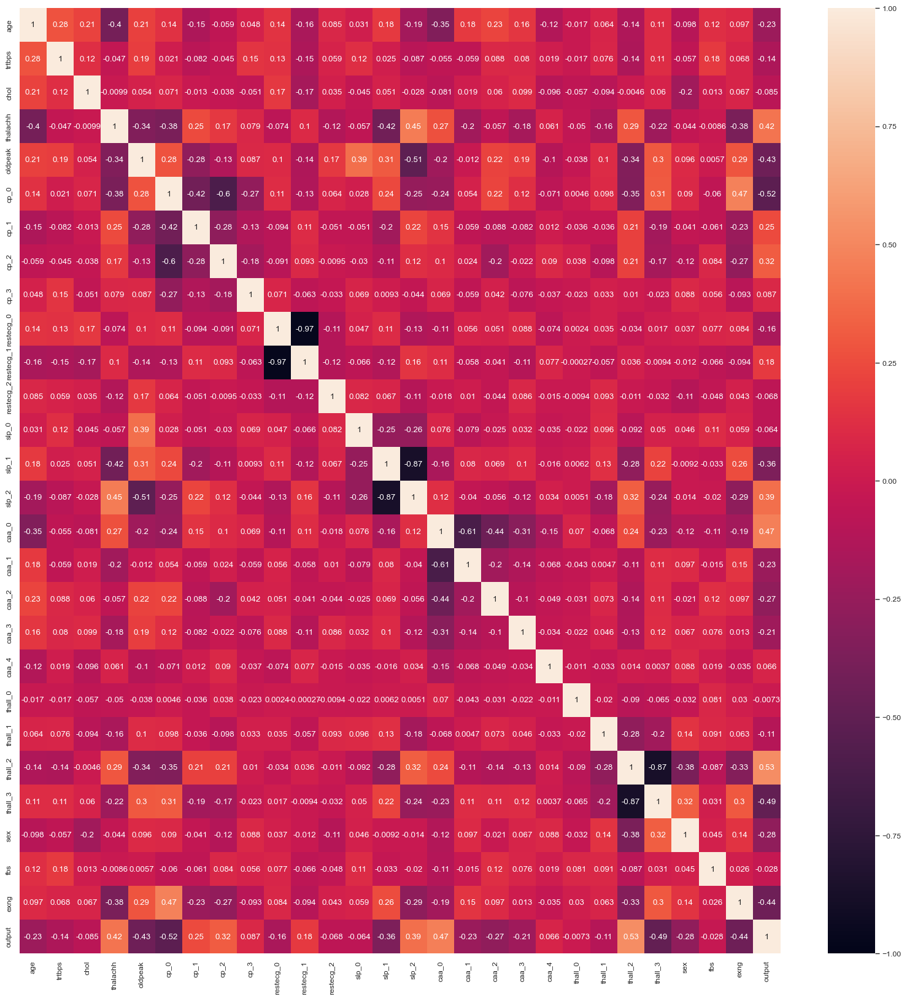

In [24]:
import matplotlib.pyplot as plt

correlation = df_t.corr()
fig = plt.figure(figsize=(20, 20))
sea.heatmap(correlation, annot=True, vmin=-1, vmax=1)
fig.savefig('Heatmap', dpi=600)

In [17]:
import numpy as np
corr = correlation.abs() # type: ignore
up = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))

#to_drop = corr['stroke'][corr['stroke']<0.05].index.values
to_drop= []
print(to_drop)

def Irrelevant(data, to_drop):
    return data.drop(to_drop, axis=1)

df_t = Irrelevant(df_t, to_drop)
df_t.sample(3)

[]


,age,trtbps,chol,thalachh,oldpeak,cp_0,cp_1,cp_2,cp_3,restecg_0,...,caa_3,caa_4,thall_0,thall_1,thall_2,thall_3,sex,fbs,exng,output
266,0.069886,2.762907,1.560262,-1.427664,2.036303,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
170,0.180175,-0.092738,0.188152,-0.334401,-0.379244,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0
164,-1.805024,0.364165,-1.377212,1.021244,-0.896862,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0


C:\Users\Eduardo\AppData\Local\Temp\ipykernel_20024\1580163224.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


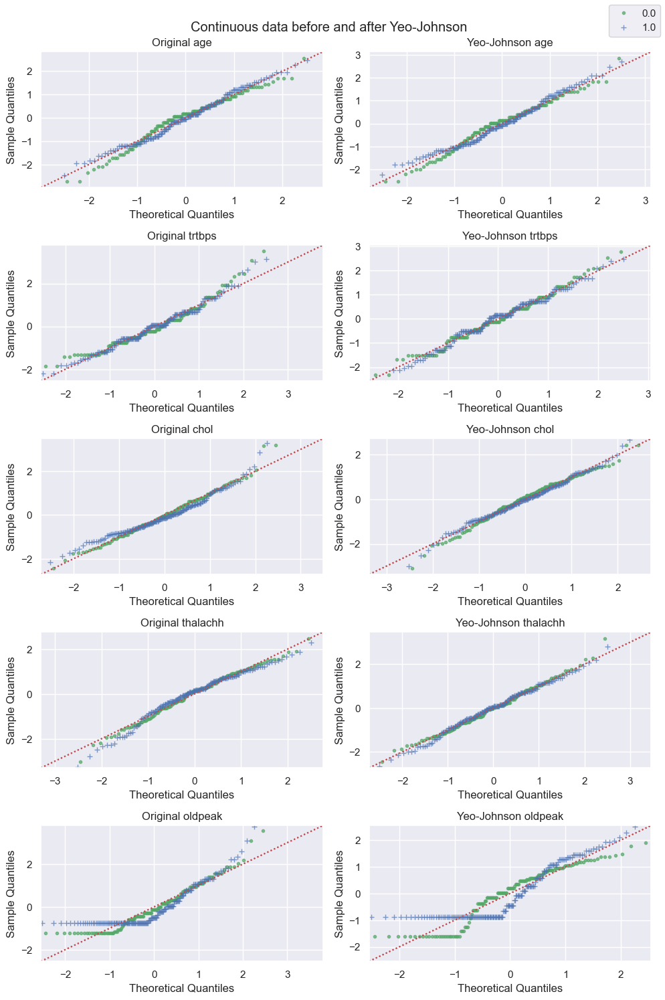

In [25]:
import statsmodels.api as sm
from scipy.stats import yeojohnson

sea.set_theme()


grouped = df_t.groupby(target)

fig, axes = plt.subplots(5, 2, figsize=(10, 15))
rows, col = 0, 0
for feature in list(df_t.columns)[:5]:
    for name, group in grouped:
        ax = axes[rows][col]
        color = 'b' if name==1 else 'g'
        marker = '+' if name==1 else '.'
        sm.qqplot(group[feature], ax=ax, marker=marker, markerfacecolor=color, 
                markeredgecolor=color, alpha=0.7, fit=True)
        sm.qqline(ax, line='45', fmt='r:')
        ax.set_title('Original ' + feature) 
    rows += 1
    
df_bxcx = df_t.copy()

def YJ(data):
    for column in data.columns[:5]:
        transformed_column, _ = yeojohnson(data[column])
        data[column] = transformed_column
    return data

df_yj = YJ(df_bxcx)
    
grouped = df_yj.groupby(target)
rows, col = 0, 1
for feature in list(df_yj.columns)[:5]:       
    for name, group in grouped:
        legend = (name if rows==1 and col==1 else None) 
        ax = axes[rows][col]
        color = 'b' if name==1 else 'g'
        marker = '+' if name==1 else '.'
        sm.qqplot(group[feature], ax=ax, marker=marker, markerfacecolor=color, 
                markeredgecolor=color, alpha=0.7, fit=True, label=legend)
        sm.qqline(ax, line='45', fmt='r:')
        ax.set_title('Yeo-Johnson ' + feature) 
    rows += 1

fig.legend(loc=1)
fig.suptitle('Continuous data before and after Yeo-Johnson')
fig.savefig('Continuous data before and after Yeo-Johnson', dpi=600)
fig.tight_layout()
fig.show()

In [19]:
X = df_yj.drop(target, axis=1)
y = df_yj[target]

Métodos de Validación (Técnicas de Remuestreo) aplicando Regresión logística

División por porcentaje.

In [20]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=5338)

lr = LogisticRegression()
lr.fit(X_train, y_train)

LogisticRegression()

In [21]:
lr.score(X_test, y_test)

0.8524590163934426

Validación cruzada

In [22]:
from sklearn.model_selection import KFold #iteraciones
from sklearn.model_selection import cross_val_score # Metodo de validacion = Validacion cruzada

num_folds = 10 # cuantas separaciones
kfold = KFold(n_splits = num_folds, shuffle=True)
result=cross_val_score(lr, X, y, cv=kfold) #La segunda posicion es hacia que lo vas a comparar
print(f"Accuracy: {result.mean()*100:,.2f}%, std {result.std():,.4f}")

Accuracy: 84.84%, std 0.0872


Validación cruzada con repeticiones.

In [23]:
from sklearn.model_selection import ShuffleSplit

test_size = 0.33
n_splits = 1000
kfold=ShuffleSplit(n_splits=n_splits, test_size=test_size)
result = cross_val_score(lr, X, y, cv=kfold)
print(f"Accuracy: {result.mean()*100:,.2f}%, std {result.std():,.4f}")

Accuracy: 84.12%, std 0.0313


Leave One Out

In [24]:
from sklearn.model_selection import LeaveOneOut

loocv = LeaveOneOut()
result = cross_val_score(lr, X, y, cv=loocv)
print(f"Accuracy: {result.mean()*100:,.2f}%, std {result.std():,.4f}")

Accuracy: 84.82%, std 0.3588


División por porcentaje repetidos aleatoriamente.

In [25]:
from sklearn.model_selection import ShuffleSplit

test_size = 0.2
n_splits = 1000

kfold = ShuffleSplit(n_splits = n_splits, test_size=test_size)
result = cross_val_score(lr, X, y, cv=kfold)

print(f"Accuracy:{result.mean()*100.0:,.2f}% std: {result.std():,.4f}")

Accuracy:84.52% std: 0.0444


## Métricas para evaluación de Algoritmos.

Matriz de confusión.

In [26]:
from sklearn.metrics import confusion_matrix

predicted = lr.predict(X)
matriz = confusion_matrix(y, predicted)
print(matriz)

[[112  26]
 [ 17 148]]


In [29]:
from sklearn.metrics import cohen_kappa_score

cohen_score = cohen_kappa_score(y, predicted)
print(f'Cohen score: {cohen_score:,.4f}')

Cohen score: 0.7124


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


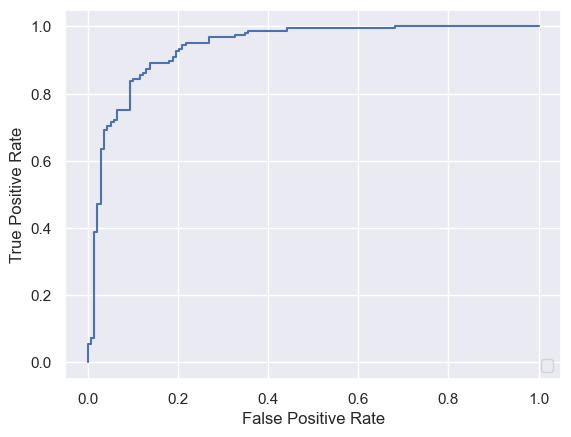

In [30]:
from sklearn.metrics import roc_curve 
from sklearn.metrics import RocCurveDisplay 

y_score = lr.decision_function(X)
fpr, tpr, _=roc_curve(y, y_score)
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()